# Logistic Regression using Scikit Learn

This type of statistical model (also known as logit model) is often used for classification and predictive analytics. Logistic regression estimates the probability of an event occurring, such as voted or didn’t vote, based on a given dataset of independent variables. **Since the outcome is a probability, the dependent variable is bounded between 0 and 1.**

## Linear Regression vs Logistic Regression
* Linear regression is a commonly used technique for solving regression problems. In a linear regression model, the target is modeled as a linear combination (or weighted sum) of input features. The predictions from the model are evaluated using a loss function like the Root Mean Squared Error (RMSE).

* Logistic regression is a commonly used technique for solving binary classification problems. 
  In a logistic regression model:

        * we take linear combination (or weighted sum of the input features)
        * we apply the sigmoid function to the result to obtain a number between 0 and 1
        * this number represents the probability of the input being classified as "Yes"
        * instead of RMSE, the cross entropy loss function is used to evaluate the results

In this notebook we will learn about:
* Exploratory data analysis and visualization
* Splitting a dataset into training, validation & test sets
* Filling/imputing missing values in numeric columns
* Scaling numeric features to a (0,1) range
* Encoding categorical columns as one-hot vectors
* Training a logistic regression model using Scikit-learn
* Evaluating a model using a validation set and test set
* Saving a model to disk and loading it back

**QUESTION:**

The Rain in Australia dataset contains about 10 years of daily weather observations from numerous Australian weather stations. As a data scientist at the Bureau of Meteorology, you are tasked with creating a fully-automated system that can use today's weather data for a given location to predict whether it will rain at the location tomorrow.

## Importing Data

In [1]:
import pandas as pd

weather_df = pd.read_csv('D:\personal_learning\ml_with_python\data\weatherAUS.csv')
weather_df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


In [2]:
#shape of the dataset
weather_df.shape

(145460, 23)

In [3]:
#checking data types and see missing values 
weather_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145460 entries, 0 to 145459
Data columns (total 23 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Date           145460 non-null  object 
 1   Location       145460 non-null  object 
 2   MinTemp        143975 non-null  float64
 3   MaxTemp        144199 non-null  float64
 4   Rainfall       142199 non-null  float64
 5   Evaporation    82670 non-null   float64
 6   Sunshine       75625 non-null   float64
 7   WindGustDir    135134 non-null  object 
 8   WindGustSpeed  135197 non-null  float64
 9   WindDir9am     134894 non-null  object 
 10  WindDir3pm     141232 non-null  object 
 11  WindSpeed9am   143693 non-null  float64
 12  WindSpeed3pm   142398 non-null  float64
 13  Humidity9am    142806 non-null  float64
 14  Humidity3pm    140953 non-null  float64
 15  Pressure9am    130395 non-null  float64
 16  Pressure3pm    130432 non-null  float64
 17  Cloud9am       89572 non-null

In [4]:
#dropping rows where 'RainTomorrow' or 'RainToday' columns are null
weather_df = weather_df.dropna(subset=['RainToday', 'RainTomorrow']).reset_index(drop=True)
weather_df

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
140782,2017-06-20,Uluru,3.5,21.8,0.0,NaN,NaN,E,31.0,ESE,...,59.0,27.0,1024.7,1021.2,NaN,NaN,9.4,20.9,No,No
140783,2017-06-21,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,...,51.0,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,No
140784,2017-06-22,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,...,56.0,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,No
140785,2017-06-23,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,...,53.0,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No


In [5]:
#checking statistics before cleaning
weather_df.describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
count,140319.000000,140480.00000,140787.000000,81093.000000,73982.000000,131682.000000,139732.000000,138256.000000,139270.000000,137286.000000,127044.000000,127018.000000,88162.000000,84693.000000,140131.000000,138163.000000
mean,12.184824,23.23512,2.349974,5.472516,7.630540,39.970520,13.990496,18.631141,68.826833,51.449288,1017.654577,1015.257963,4.431161,4.499250,16.987066,21.693183
std,6.403879,7.11450,8.465173,4.189132,3.781729,13.578201,8.886210,8.798096,19.063650,20.807310,7.104867,7.035411,2.886594,2.719752,6.496012,6.937784
min,-8.500000,-4.80000,0.000000,0.000000,0.000000,6.000000,0.000000,0.000000,0.000000,0.000000,980.500000,977.100000,0.000000,0.000000,-7.200000,-5.400000
25%,7.600000,17.90000,0.000000,2.600000,4.900000,31.000000,7.000000,13.000000,57.000000,37.000000,1013.000000,1010.400000,1.000000,2.000000,12.300000,16.600000
50%,12.000000,22.60000,0.000000,4.800000,8.500000,39.000000,13.000000,19.000000,70.000000,52.000000,1017.600000,1015.200000,5.000000,5.000000,16.700000,21.100000
75%,16.800000,28.30000,0.800000,7.400000,10.700000,48.000000,19.000000,24.000000,83.000000,66.000000,1022.400000,1020.000000,7.000000,7.000000,21.600000,26.400000
max,33.900000,48.10000,371.000000,145.000000,14.500000,135.000000,130.000000,87.000000,100.000000,100.000000,1041.000000,1039.600000,9.000000,9.000000,40.200000,46.700000


It seems like Rainfall, Evaporation, Windspeed columns have few outliers..

## Exploratory Data Analysis

In [6]:
#importing Libraries
import plotly.express as px
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

sns.set_style('darkgrid')
matplotlib.rcParams['font.size'] = 14
matplotlib.rcParams['figure.figsize'] = (10, 6)
matplotlib.rcParams['figure.facecolor'] = '#00000000'

In [7]:
# Categorizing numerical vs categorical features
numerical_columns = weather_df.select_dtypes('number').columns.to_list()
categorical_columns = weather_df.select_dtypes('object').columns.to_list()

In [8]:
weather_df.Location.nunique()

49

### Histogram of Location vs RainToday

In [10]:
px.histogram(weather_df,
             x='Location',
             color='RainToday',
             title='Location vs RainToday')

This graph shows the rain distribution for different locations. This shows that aboout 20% of the time it rained in a particular location.

### Histogram of Temp3pm vs RainTomorrow

In [11]:
px.histogram(weather_df,
             x='Temp3pm',
             color='RainTomorrow',
             title='Location vs RainTomorrow')

If the temp at 3pm is low, it is less likely to rain tomorrow..
|

### Histogram of RainToday vs Evaporation

In [12]:
px.histogram(weather_df,
             x='Evaporation',
             color='RainTomorrow',
             title='Evaporation vs RainTomorrow',nbins=1000)

### Histogram of RainToday vs Rain Tomorrow

In [13]:
px.histogram(weather_df,
             x='RainToday',
             color='RainTomorrow',
             title='RainToday vs RainTomorrow',nbins=1000)

From this we can understand that, If it doesnt rain today then there is a higher chance that it wont rain tomorrow. But whereas if it rains today, it is difficult to predict whether it will rain tomorrow because tboth of them have almost same probability.

#### Class Imbalance
Here you can clearly see that there is a class imbalance in RainToday. Around 90% of the RainTomorrow column has Yes as target. This is a problem while trainging a model.

### Scatter plot of MinTemp vs MaxTemp


In [14]:
px.scatter(weather_df.sample(2000), x='MinTemp', y='MaxTemp', color='RainToday', title='MaxTemp vs Min Temp')

Here you can see that, the variation difference of the temperature is less in Rainy days rather than non rainy days..

## Train, Validation, Test Split

While building real-world machine learning models, it is quite common to split the dataset into three parts:

1. **Training set** - used to train the model, i.e., compute the loss and adjust the model's weights using an optimization technique.

2. **Validation set** - used to evaluate the model during training, tune model hyperparameters (optimization technique, regularization etc.), and pick the best version of the model. Picking a good validation set is essential for training models that generalize well.

3. **Test set** - used to compare different models or approaches and report the model's final accuracy. For many datasets, test sets are provided separately. The test set should reflect the kind of data the model will encounter in the real-world, as closely as feasible.


As a general rule of thumb you can use around 60% of the data for the training set, 20% for the validation set and 20% for the test set. If a separate test set is already provided, you can use a 75%-25% training-validation split.

In [15]:
#importing library
from sklearn.model_selection import train_test_split

In [16]:
train_val_df, test_df = train_test_split(weather_df, test_size=0.2, random_state=42)
train_df, val_df = train_test_split(train_val_df, test_size=0.25, random_state=42)

In [17]:
print("Training dataset:", train_df.shape)
print("Validation dataset:", val_df.shape)
print("Testing dataset:", test_df.shape)

Training dataset: (84471, 23)
Validation dataset: (28158, 23)
Testing dataset: (28158, 23)


Now we will be using the train_df for all the data processing procedures for training 

**However while playing with date, its always better to split the data in such a way that we use the past data for training and future data for testing. So here we are going to split the dataset based on Date (year)**

In [18]:
pd.to_datetime(weather_df['Date']).dt.year

0         2008
1         2008
2         2008
3         2008
4         2008
          ... 
140782    2017
140783    2017
140784    2017
140785    2017
140786    2017
Name: Date, Length: 140787, dtype: int64

<Axes: title={'center': 'Sample Count Per Year'}, xlabel='Date', ylabel='count'>

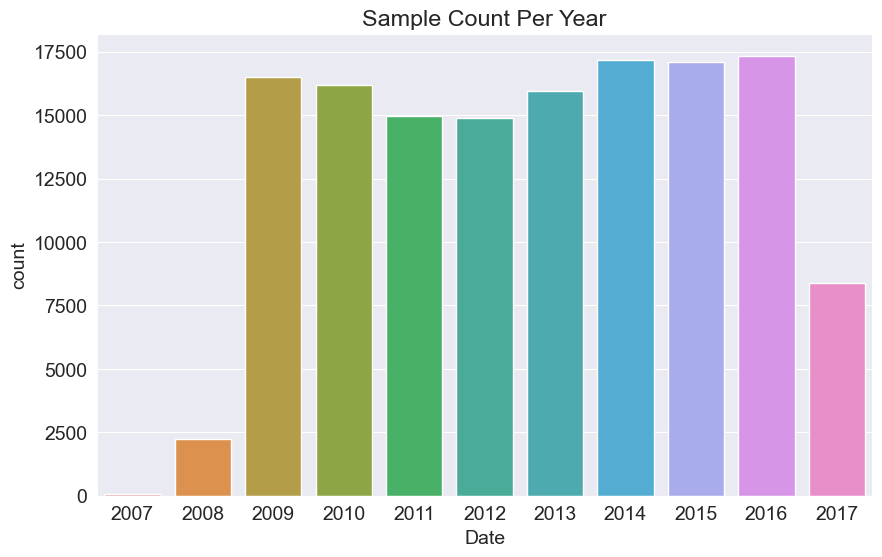

In [19]:
plt.title('Sample Count Per Year')
sns.countplot(x=pd.to_datetime(weather_df['Date']).dt.year, data=weather_df)

We will use data till 2015 for testing, year=2015 for validation and the rest for testing

In [20]:
#splitting dataframe
train_df = weather_df[pd.to_datetime(weather_df['Date']).dt.year<2015].reset_index(drop=True)
val_df = weather_df[pd.to_datetime(weather_df['Date']).dt.year==2015].reset_index(drop=True)
test_df = weather_df[pd.to_datetime(weather_df['Date']).dt.year>2015].reset_index(drop=True)

In [21]:
print("Training dataset:", train_df.shape)
print("Validation dataset:", val_df.shape)
print("Testing dataset:", test_df.shape)

Training dataset: (97988, 23)
Validation dataset: (17089, 23)
Testing dataset: (25710, 23)


In [22]:
train_df

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
97983,2014-12-27,Uluru,16.9,33.2,0.0,NaN,NaN,SSE,43.0,ESE,...,22.0,13.0,1014.1,1009.8,NaN,NaN,23.7,31.8,No,No
97984,2014-12-28,Uluru,15.1,36.8,0.0,NaN,NaN,NE,31.0,ENE,...,16.0,8.0,1012.6,1007.6,NaN,NaN,28.9,34.8,No,No
97985,2014-12-29,Uluru,17.3,37.8,0.0,NaN,NaN,ESE,39.0,ESE,...,15.0,8.0,1011.9,1008.0,NaN,NaN,29.7,35.7,No,No
97986,2014-12-30,Uluru,20.1,38.5,0.0,NaN,NaN,ESE,43.0,ESE,...,22.0,9.0,1014.0,1009.2,NaN,NaN,29.8,37.2,No,No


In [23]:
val_df

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2015-01-01,Albury,11.4,33.5,0.0,NaN,NaN,WSW,30.0,ESE,...,45.0,14.0,1013.5,1011.0,NaN,NaN,21.0,32.7,No,No
1,2015-01-02,Albury,15.5,39.6,0.0,NaN,NaN,NE,56.0,ESE,...,45.0,12.0,1016.0,1012.4,NaN,NaN,25.6,38.2,No,No
2,2015-01-03,Albury,17.1,38.3,0.0,NaN,NaN,NNE,48.0,NE,...,35.0,19.0,1017.9,1012.3,NaN,NaN,29.2,37.0,No,No
3,2015-01-04,Albury,26.0,33.1,0.0,NaN,NaN,NNE,41.0,ESE,...,46.0,37.0,1013.6,1012.1,8.0,5.0,27.4,30.9,No,No
4,2015-01-05,Albury,19.0,35.2,0.0,NaN,NaN,E,33.0,SSE,...,60.0,34.0,1017.4,1014.7,8.0,NaN,25.6,32.5,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17084,2015-12-27,Uluru,20.5,34.7,0.0,NaN,NaN,E,52.0,ESE,...,23.0,12.0,1013.2,1010.1,NaN,NaN,24.3,33.0,No,No
17085,2015-12-28,Uluru,18.0,36.4,0.0,NaN,NaN,ESE,54.0,E,...,17.0,7.0,1014.7,1010.9,NaN,NaN,26.7,35.0,No,No
17086,2015-12-29,Uluru,17.5,37.1,0.0,NaN,NaN,E,56.0,E,...,12.0,7.0,1012.6,1007.5,NaN,NaN,28.1,34.7,No,No
17087,2015-12-30,Uluru,20.0,38.9,0.0,NaN,NaN,E,59.0,E,...,12.0,12.0,1007.2,1002.6,NaN,1.0,31.3,38.4,No,No


In [24]:
test_df

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2016-01-01,Albury,20.4,37.6,0.0,NaN,NaN,ENE,54.0,NaN,...,46.0,17.0,1013.4,1009.2,7.0,3.0,26.1,36.7,No,No
1,2016-01-02,Albury,20.9,33.6,0.4,NaN,NaN,SSE,50.0,SSE,...,54.0,30.0,1011.1,1008.4,8.0,8.0,24.8,31.7,No,Yes
2,2016-01-03,Albury,18.4,23.1,2.2,NaN,NaN,ENE,48.0,ESE,...,62.0,67.0,1014.0,1014.8,8.0,8.0,21.8,19.5,Yes,Yes
3,2016-01-04,Albury,17.3,23.7,15.6,NaN,NaN,SSE,39.0,SE,...,74.0,65.0,1017.9,1016.5,8.0,8.0,19.2,21.6,Yes,Yes
4,2016-01-05,Albury,15.5,22.9,6.8,NaN,NaN,ENE,31.0,SE,...,92.0,63.0,1016.3,1013.9,8.0,8.0,17.2,22.2,Yes,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25705,2017-06-20,Uluru,3.5,21.8,0.0,NaN,NaN,E,31.0,ESE,...,59.0,27.0,1024.7,1021.2,NaN,NaN,9.4,20.9,No,No
25706,2017-06-21,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,...,51.0,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,No
25707,2017-06-22,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,...,56.0,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,No
25708,2017-06-23,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,...,53.0,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No


## Identifying Input and Output Columns

We can only use the columns that are necessary for the input columns and drop all the rest....

In [25]:
input_cols = list(train_df.columns)[1:-1]
target_col = 'RainTomorrow'

In [26]:
print(input_cols)

['Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine', 'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm', 'RainToday']


In [27]:
target_col

'RainTomorrow'

 Create Input and Target Dataframes for each Train, Val, Test Splits

In [166]:
#inputs and target for train_df
train_inputs = train_df[input_cols].copy()
train_targets = train_df[target_col].copy()

#inputs and target for val_df
val_inputs = val_df[input_cols].copy()
val_targets = val_df[target_col].copy()

#inputs and target for test_df
test_inputs = test_df[input_cols].copy()
test_targets = test_df[target_col].copy()

In [167]:
train_inputs

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday
0,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,WNW,...,24.0,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No
1,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,WSW,...,22.0,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No
2,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,WSW,...,26.0,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No
3,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,E,...,9.0,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No
4,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,NW,...,20.0,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
97983,Uluru,16.9,33.2,0.0,NaN,NaN,SSE,43.0,ESE,SSE,...,26.0,22.0,13.0,1014.1,1009.8,NaN,NaN,23.7,31.8,No
97984,Uluru,15.1,36.8,0.0,NaN,NaN,NE,31.0,ENE,SW,...,20.0,16.0,8.0,1012.6,1007.6,NaN,NaN,28.9,34.8,No
97985,Uluru,17.3,37.8,0.0,NaN,NaN,ESE,39.0,ESE,SSE,...,9.0,15.0,8.0,1011.9,1008.0,NaN,NaN,29.7,35.7,No
97986,Uluru,20.1,38.5,0.0,NaN,NaN,ESE,43.0,ESE,SSW,...,17.0,22.0,9.0,1014.0,1009.2,NaN,NaN,29.8,37.2,No


In [168]:
train_targets

0        No
1        No
2        No
3        No
4        No
         ..
97983    No
97984    No
97985    No
97986    No
97987    No
Name: RainTomorrow, Length: 97988, dtype: object

**Identifying Categorical and Numerical Features..**

In [169]:
train_inputs.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 97988 entries, 0 to 97987
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Location       97988 non-null  object 
 1   MinTemp        97674 non-null  float64
 2   MaxTemp        97801 non-null  float64
 3   Rainfall       97988 non-null  float64
 4   Evaporation    61657 non-null  float64
 5   Sunshine       57942 non-null  float64
 6   WindGustDir    91120 non-null  object 
 7   WindGustSpeed  91160 non-null  float64
 8   WindDir9am     90969 non-null  object 
 9   WindDir3pm     96036 non-null  object 
 10  WindSpeed9am   97114 non-null  float64
 11  WindSpeed3pm   96919 non-null  float64
 12  Humidity9am    96936 non-null  float64
 13  Humidity3pm    96872 non-null  float64
 14  Pressure9am    88876 non-null  float64
 15  Pressure3pm    88857 non-null  float64
 16  Cloud9am       63000 non-null  float64
 17  Cloud3pm       61966 non-null  float64
 18  Temp9a

In [170]:
numerical_columns = train_inputs.select_dtypes(include='number').columns.to_list()
categorical_columns = train_inputs.select_dtypes(include='object').columns.to_list()

In [171]:
numerical_columns

['MinTemp',
 'MaxTemp',
 'Rainfall',
 'Evaporation',
 'Sunshine',
 'WindGustSpeed',
 'WindSpeed9am',
 'WindSpeed3pm',
 'Humidity9am',
 'Humidity3pm',
 'Pressure9am',
 'Pressure3pm',
 'Cloud9am',
 'Cloud3pm',
 'Temp9am',
 'Temp3pm']

In [172]:
categorical_columns

['Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday']

In [173]:
#statisics of numerical columns
train_inputs[numerical_columns].describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
count,97674.000000,97801.000000,97988.000000,61657.000000,57942.000000,91160.000000,97114.000000,96919.000000,96936.000000,96872.000000,88876.000000,88857.000000,63000.000000,61966.000000,97414.000000,97392.000000
mean,12.007831,23.022202,2.372935,5.289991,7.609004,40.215873,14.092263,18.764608,68.628745,51.469547,1017.513734,1015.132352,4.302952,4.410677,16.835126,21.540138
std,6.347175,6.984397,8.518819,3.952010,3.788813,13.697967,8.984203,8.872398,19.003097,20.756113,7.072510,6.997072,2.866634,2.693370,6.404586,6.831612
min,-8.500000,-4.100000,0.000000,0.000000,0.000000,6.000000,0.000000,0.000000,0.000000,0.000000,980.500000,979.000000,0.000000,0.000000,-5.900000,-5.100000
25%,7.500000,17.900000,0.000000,2.600000,4.800000,31.000000,7.000000,13.000000,57.000000,37.000000,1012.800000,1010.400000,1.000000,2.000000,12.200000,16.600000
50%,11.800000,22.400000,0.000000,4.600000,8.500000,39.000000,13.000000,19.000000,70.000000,52.000000,1017.500000,1015.100000,5.000000,5.000000,16.600000,20.900000
75%,16.600000,27.900000,0.800000,7.200000,10.600000,48.000000,19.000000,24.000000,83.000000,66.000000,1022.300000,1019.900000,7.000000,7.000000,21.400000,26.200000
max,33.900000,48.100000,371.000000,82.400000,14.300000,135.000000,87.000000,87.000000,100.000000,100.000000,1041.000000,1039.600000,9.000000,9.000000,40.200000,46.100000


<Axes: >

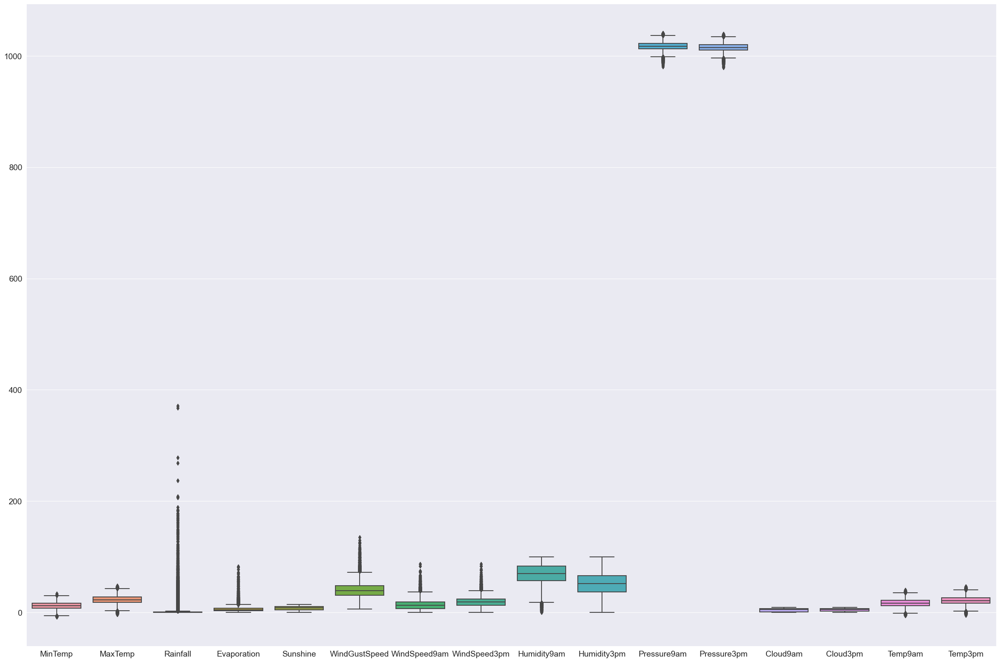

In [174]:
fig = plt.subplots(figsize=(30, 20))

sns.boxplot(train_inputs[numerical_columns])

In [175]:
train_inputs[categorical_columns].nunique()

Location       49
WindGustDir    16
WindDir9am     16
WindDir3pm     16
RainToday       2
dtype: int64

## Imputing Missing Values

Inorder to train a machine learning model, we need to remove all NaN values out of the data. There are several techniques to do this. We can also impute new values accordingly to do the same. This process is called **Imputation**. One basic way is to impute the mean values.

In [176]:
from sklearn.impute import SimpleImputer

imputer = SimpleImputer(strategy='mean')

Checking the number of missing values in each columns

In [177]:
weather_df[numerical_columns].isna().sum()

MinTemp            468
MaxTemp            307
Rainfall             0
Evaporation      59694
Sunshine         66805
WindGustSpeed     9105
WindSpeed9am      1055
WindSpeed3pm      2531
Humidity9am       1517
Humidity3pm       3501
Pressure9am      13743
Pressure3pm      13769
Cloud9am         52625
Cloud3pm         56094
Temp9am            656
Temp3pm           2624
dtype: int64

In [178]:
#fitting the data
imputer.fit(weather_df[numerical_columns])

SimpleImputer()

In [179]:
#Averages for each column
imputer.statistics_

array([  12.18482387,   23.2351203 ,    2.34997407,    5.47251551,
          7.63053986,   39.97051989,   13.99049609,   18.63114078,
         68.82683277,   51.44928835, 1017.65457715, 1015.25796259,
          4.43116082,    4.49925023,   16.98706639,   21.69318269])

Next we need to transform all the data using these average values|

In [180]:
imputer.transform(train_inputs[numerical_columns])

array([[13.4       , 22.9       ,  0.6       , ...,  4.49925023,
        16.9       , 21.8       ],
       [ 7.4       , 25.1       ,  0.        , ...,  4.49925023,
        17.2       , 24.3       ],
       [12.9       , 25.7       ,  0.        , ...,  2.        ,
        21.        , 23.2       ],
       ...,
       [17.3       , 37.8       ,  0.        , ...,  4.49925023,
        29.7       , 35.7       ],
       [20.1       , 38.5       ,  0.        , ...,  4.49925023,
        29.8       , 37.2       ],
       [22.5       , 39.6       ,  0.        , ...,  4.49925023,
        30.1       , 37.4       ]])

Here you can see the new after imputing the mean to the missing values.. Now lets add these into the dataframe..

In [181]:
#imputing the new values to the dataframe
train_inputs[numerical_columns] = imputer.transform(train_inputs[numerical_columns])
val_inputs[numerical_columns] = imputer.transform(val_inputs[numerical_columns])
test_inputs[numerical_columns] = imputer.transform(test_inputs[numerical_columns])

In [182]:
train_inputs

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday
0,Albury,13.4,22.9,0.6,5.472516,7.63054,W,44.0,W,WNW,...,24.0,71.0,22.0,1007.7,1007.1,8.000000,4.49925,16.9,21.8,No
1,Albury,7.4,25.1,0.0,5.472516,7.63054,WNW,44.0,NNW,WSW,...,22.0,44.0,25.0,1010.6,1007.8,4.431161,4.49925,17.2,24.3,No
2,Albury,12.9,25.7,0.0,5.472516,7.63054,WSW,46.0,W,WSW,...,26.0,38.0,30.0,1007.6,1008.7,4.431161,2.00000,21.0,23.2,No
3,Albury,9.2,28.0,0.0,5.472516,7.63054,NE,24.0,SE,E,...,9.0,45.0,16.0,1017.6,1012.8,4.431161,4.49925,18.1,26.5,No
4,Albury,17.5,32.3,1.0,5.472516,7.63054,W,41.0,ENE,NW,...,20.0,82.0,33.0,1010.8,1006.0,7.000000,8.00000,17.8,29.7,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
97983,Uluru,16.9,33.2,0.0,5.472516,7.63054,SSE,43.0,ESE,SSE,...,26.0,22.0,13.0,1014.1,1009.8,4.431161,4.49925,23.7,31.8,No
97984,Uluru,15.1,36.8,0.0,5.472516,7.63054,NE,31.0,ENE,SW,...,20.0,16.0,8.0,1012.6,1007.6,4.431161,4.49925,28.9,34.8,No
97985,Uluru,17.3,37.8,0.0,5.472516,7.63054,ESE,39.0,ESE,SSE,...,9.0,15.0,8.0,1011.9,1008.0,4.431161,4.49925,29.7,35.7,No
97986,Uluru,20.1,38.5,0.0,5.472516,7.63054,ESE,43.0,ESE,SSW,...,17.0,22.0,9.0,1014.0,1009.2,4.431161,4.49925,29.8,37.2,No


In [183]:
train_inputs[numerical_columns].isna().sum()

MinTemp          0
MaxTemp          0
Rainfall         0
Evaporation      0
Sunshine         0
WindGustSpeed    0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
Temp3pm          0
dtype: int64

## Feature Scaling

Its always better to scale the data into a similar range so that no particular feature plays a disproportionate role.. You can use different scaling methods to do the same such as MinMaxScaler, StandarScaler etc...


In [184]:
#defining the scaler
from sklearn.preprocessing import MinMaxScaler

min_max_scaler = MinMaxScaler()

In [185]:
min_max_scaler

MinMaxScaler()

In [186]:
#fitting and transforming
train_inputs[numerical_columns] = min_max_scaler.fit_transform(train_inputs[numerical_columns])

In [220]:
# printing the Minimum and Maximum values for each columns
min_max_df = pd.DataFrame({'minimum': min_max_scaler.data_min_, 'maximum': min_max_scaler.data_max_}, index=numerical_columns)

min_max_df

,minimum,maximum
MinTemp,-8.5,33.9
MaxTemp,-4.1,48.1
Rainfall,0.0,371.0
Evaporation,0.0,82.4
Sunshine,0.0,14.3
WindGustSpeed,6.0,135.0
WindSpeed9am,0.0,87.0
WindSpeed3pm,0.0,87.0
Humidity9am,0.0,100.0
Humidity3pm,0.0,100.0
